In [ ]:
import geopandas as gpd
import plotly.graph_objects as go
import pandas as pd
import plotly.io as pio

pio.renderers.default = 'notebook'

# load geofiles
fastfood = gpd.read_file("Data/fastfood_location_name_amenity.gpkg")
pizza = gpd.read_file("Data/pizza_location_name_cuisine.gpkg")

# ensuring same coordinate encoding 
for gdf in [fastfood, pizza]:
    if gdf.crs is not None and gdf.crs.to_epsg() != 4326:
        gdf.to_crs(epsg=4326, inplace=True)

# extract coordinates
fastfood["lat"] = fastfood.geometry.centroid.y
fastfood["lon"] = fastfood.geometry.centroid.x

pizza["lat"] = pizza.geometry.centroid.y
pizza["lon"] = pizza.geometry.centroid.x

# load crash data and remove nans
crashes = pd.read_csv("Data/CrashStatisticsFranklinCounty.csv")
crashes = crashes.dropna(subset=["Latitude", "Longitude"])

# load traffic light data and remove nans
traffic_lights = pd.read_csv("Data/franklin_county_traffic_lights.csv")
traffic_lights = traffic_lights.dropna(subset=["lat", "lon"])

# Visualization figure
fig = go.Figure()

# Crashes
fig.add_trace(
    go.Scattermapbox(
        lat=crashes["Latitude"],
        lon=crashes["Longitude"],
        mode="markers",
        marker=go.scattermapbox.Marker(
            size=7,
            color="red",
            opacity=0.5
        ),
        name="Crashes"
    )
)

# Fast food 
fig.add_trace(
    go.Scattermapbox(
        lat=fastfood["lat"],
        lon=fastfood["lon"],
        mode="markers",
        marker=go.scattermapbox.Marker(size=10, color="blue"),
        text=fastfood["name_normalized"],
        name="Fast Food"
    )
)

# Pizza places 
fig.add_trace(
    go.Scattermapbox(
        lat=pizza["lat"],
        lon=pizza["lon"],
        mode="markers",
        marker=go.scattermapbox.Marker(size=10, color="orange"),
        #text=pizza["name"],
        name="Pizza Places"
    )
)

# Traffic lights 
fig.add_trace(
    go.Scattermapbox(
        lat=traffic_lights["lat"],
        lon=traffic_lights["lon"],
        mode="markers",
        marker=go.scattermapbox.Marker(size=5, color="green"),
        text=traffic_lights.get("location_name", None),
        name="Traffic Lights"
    )
)



# layout settings
fig.update_layout(
    mapbox=dict(
        style="carto-positron",
        center=dict(lat=39.96, lon=-83.0),  # Franklin County center
        zoom=10
    ),
    title="Crashes, Fast Food, Traffic Lights, and Pizza Locations in Franklin County",
    margin=dict(l=0, r=0, t=50, b=0),
    legend=dict(
        yanchor="top", y=0.98,
        xanchor="left", x=0.02,
        bgcolor="rgba(255,255,255,0.9)"
    )
)

fig.show()


C:\Users\raab.75\AppData\Local\Temp\ipykernel_28704\1656743478.py:18: UserWarning:

Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.


C:\Users\raab.75\AppData\Local\Temp\ipykernel_28704\1656743478.py:19: UserWarning:

Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.


C:\Users\raab.75\AppData\Local\Temp\ipykernel_28704\1656743478.py:21: UserWarning:

Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.


C:\Users\raab.75\AppData\Local\Temp\ipykernel_28704\1656743478.py:22: UserWarning:

Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected C

In [75]:
fastfood

,element,id,addr:city,addr:housenumber,addr:postcode,addr:state,addr:street,alt_name,amenity,brand,...,oneway,service,delivery:partner,internet_access:password,building:use,shop:historic,type,lat,lon,geometry
0,node,256553025,Loveland,10689,45140,OH,Loveland Madeira Road,None,fast_food,Tropical Smoothie Cafe,...,None,None,None,None,None,None,None,39.255059,-84.295558,POINT (-84.29556 39.25506)
1,node,256553326,Cincinnati,11902,45249,OH,Montgomery Road,None,fast_food,Papa John's,...,None,None,None,None,None,None,None,39.285234,-84.308865,POINT (-84.30886 39.28523)
2,node,256553679,None,None,None,None,None,None,fast_food,Domino's,...,None,None,None,None,None,None,None,39.287319,-84.307707,POINT (-84.30771 39.28732)
3,node,256555619,Mason,9540,45040,OH,Mason Montgomery Road,None,fast_food,Chipotle,...,None,None,None,None,None,None,None,39.299528,-84.314241,POINT (-84.31424 39.29953)
4,node,256658672,None,None,None,None,None,None,fast_food,Panera Bread,...,None,None,None,None,None,None,None,39.272762,-84.327882,POINT (-84.32788 39.27276)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6149,way,1442159300,Middleburg Heights,18120,44130,OH,Bagley Road,None,fast_food,Raising Cane's,...,None,None,None,None,None,None,None,41.372460,-81.827688,"POLYGON ((-81.82775 41.3726, -81.82761 41.3726..."
6150,way,1442194424,Hillsboro,1279,45133,OH,North High Street,None,fast_food,Arby's,...,None,None,None,None,None,None,None,39.222725,-83.609522,"POLYGON ((-83.60937 39.22271, -83.60937 39.222..."
6151,way,1442194452,None,None,None,None,None,None,fast_food,Little Caesars,...,None,None,None,None,None,None,None,39.229193,-83.611711,"POLYGON ((-83.61177 39.22917, -83.61179 39.229..."
6152,way,1444849594,Frazeysburg,35,43822,OH,North State Street,None,fast_food,Subway,...,None,None,None,None,None,None,None,40.118572,-82.117102,"POLYGON ((-82.11716 40.11864, -82.11717 40.118..."


In [76]:
# now we load the filtered data set with the narratives and look for fast food mentions

import re 
import pandas as pd

# load the file with the narratives from the crash report

narratives1 = pd.read_csv("Data/Franklin_DocumentNumber_Narrative_Latitude_Longitude_part1.csv")
narratives2 = pd.read_csv("Data/Franklin_DocumentNumber_Narrative_Latitude_Longitude_part2.csv")

# merge the files in one
narratives = pd.concat([narratives1, narratives2], ignore_index=True)

# save the narratives as its own csv
narratives.to_csv("Data/Franklin_DocumentNumber_Narrative_Latitude_Longitude_full.csv", index=False)

# check the occurances of the fastfood chains
fastfood_counts = fastfood["name"].value_counts()

# convert to a DataFrame for nicer display
fastfood_counts_df = fastfood_counts.reset_index()

print(fastfood_counts[:10])
top10_fastfood = fastfood_counts[:10]
top20_fastfood = fastfood_counts[:20]


# load the pizza places
pizza = gpd.read_file("Data/pizza_places_ohio.gpkg", layer="pizza_places")
# check the occurances of the pizza chains
pizza_counts = pizza["name"].value_counts()

# convert to dataframe for nicer display
pizza_counts_df = pizza_counts.reset_index()
#pizza_counts_df.columns = ["fastfood_chain", "count"]

print(pizza_counts[:10])
top10_pizza = pizza_counts[:10]
top20_pizza = pizza_counts[:20]


# Preview
print(f"Number of narratives mentioning fast-food places: {len(narratives_fastfood)}")
print(narratives_fastfood.head(2))  

#indices_fastfood = narratives.index[mask]
#indices_near_fastfood = df.index[df["near_fastfood"] == True]

#overlap = indices_fastfood.intersection(indices_near_fastfood)
#print(f"Number of overlapping indices: {len(overlap)}")





name
McDonald's     614
Subway         585
Wendy's        368
Taco Bell      325
Burger King    281
Arby's         245
Chipotle       214
Domino's       162
Dunkin'        162
KFC            156
Name: count, dtype: int64
name
Pizza Hut                174
Domino's                 161
Little Caesars            99
Papa John's               83
Marco's Pizza             83
Donatos Pizza             69
LaRosa's Pizzeria         30
Jet's Pizza               19
Gionino's Pizzeria        18
East of Chicago Pizza     18
Name: count, dtype: int64
Number of narratives mentioning fast-food places: 557
   DocumentNumber           County  \
0     20203168201  Franklin County   
1     20203169023  Franklin County   

                                           Narrative  
0  Unit 1 was traveling south on Main Street pass...  
1  On 10-6-2020 Unit #1 was traveling from North ...  


In [17]:
#getting the names only
pizza_10names = top10_pizza.index[:]
fastfood_10names = top10_fastfood.index[:]

print(pizza_10names)
print(fastfood_10names)

Index(['Pizza Hut', 'Domino's', 'Little Caesars', 'Papa John's',
       'Marco's Pizza', 'Donatos Pizza', 'LaRosa's Pizzeria', 'Jet's Pizza',
       'Gionino's Pizzeria', 'East of Chicago Pizza'],
      dtype='object', name='name')
Index(['McDonald's', 'Subway', 'Wendy's', 'Taco Bell', 'Burger King', 'Arby's',
       'Chipotle', 'Domino's', 'Dunkin'', 'KFC'],
      dtype='object', name='name')


In [18]:
# the spelling of the restaurant places can vary in the reports, so look for apostrophes in the name and 
# just go with the name before the apostrophe
# (the order matters)
pizza_names_stub = [name.split("s ")[0] for name in top10_pizza.index[:]]
pizza_names_stub = [name.split("'")[0] for name in top10_pizza.index[:]]
print(pizza_names_stub)


# same for the fastfood places
fastfood_names_stub = [name.split("'")[0] for name in top10_fastfood.index[:]]
print(fastfood_names_stub)

['Pizza Hut', 'Domino', 'Little Caesars', 'Papa John', 'Marco', 'Donatos Pizza', 'LaRosa', 'Jet', 'Gionino', 'East of Chicago Pizza']
['McDonald', 'Subway', 'Wendy', 'Taco Bell', 'Burger King', 'Arby', 'Chipotle', 'Domino', 'Dunkin', 'KFC']


In [32]:
narratives

,DocumentNumber,County,Latitude,Longitude,Narrative
0,20202168971,Franklin County,39.953682,-83.099864,Unit# 1 a pedestrian was crossing US-40 from s...
1,20202168999,Franklin County,39.832050,-82.984140,Unit 1 was westbound on SR 317 towards Parsons...
2,20202172825,Franklin County,39.806068,-83.030432,Unit 2 was traveling south on SR 104 south of ...
3,20202183697,Franklin County,39.953254,-83.098701,Unit 1 was crossing US 40 outside of the cross...
4,20202206898,Franklin County,40.048172,-82.944954,Unit 1 was driving south on SR 3 just north of...
...,...,...,...,...,...
115676,20258172808,Franklin County,40.031000,-83.051000,On Sunday; September 21; 2025; Unit 2 was stop...
115677,20258173076,Franklin County,39.955371,-82.873076,On above date and time U-1 failed to yield at ...
115678,20258173087,Franklin County,39.954530,-82.878540,Unit #1 was traveling eastbound on Josephus Ln...
115679,20258173091,Franklin County,39.959634,-82.878754,During the night of September 13th; 2025 after...


In [33]:
# now we have the list of the top 10 restaurant names,
# now look through the narratives and search for these words

# set up a new dictionary to store the information
narrative_names = {}

for word in fastfood_names_stub:
    if word.strip() == "Arby":
        mask = narratives["Narrative"].str.contains(r'\sArby', case=False, na=False)
    else:
        mask = narratives["Narrative"].str.contains(word, case=False, na=False)
    print(word)
    matching_reports = narratives.loc[mask, ["DocumentNumber","Longitude","Latitude"]]
    narrative_names[word] = matching_reports

McDonald
Subway
Wendy
Taco Bell
Burger King
Arby
Chipotle
Domino
Dunkin
KFC


In [34]:
# check all the DocumentNumbers for a certain fast food chain
print(narrative_names["McDonald"])

        DocumentNumber  Longitude   Latitude
497        20203168201 -83.160846  40.026772
570        20203169023 -83.112900  39.936340
714        20203171089 -82.970780  39.959050
986        20203175958 -83.044279  39.957380
1513       20203183836 -82.971170  39.953980
...                ...        ...        ...
113202     20253155992 -82.934959  39.868649
113591     20253160667 -82.917194  39.946947
113951     20253164925 -82.881550  39.897590
114296     20253168048 -82.917180  39.946970
115618     20258158560 -82.874887  39.955807

[313 rows x 3 columns]


In [35]:
# just a check to see how often a certain chain is mentioned
key_lengths = {key: len(narrative_names[key]) for key in narrative_names}

print(key_lengths)

{'McDonald': 313, 'Subway': 21, 'Wendy': 90, 'Taco Bell': 49, 'Burger King': 22, 'Arby': 8, 'Chipotle': 22, 'Domino': 6, 'Dunkin': 9, 'KFC': 23}


In [36]:
#easy overview of the restaurants in order of their count of mentions
sorted_narrative_names = sorted(narrative_names, key=lambda k: len(narrative_names[k]), reverse=True)
print(sorted_narrative_names)

['McDonald', 'Wendy', 'Taco Bell', 'KFC', 'Burger King', 'Chipotle', 'Subway', 'Dunkin', 'Arby', 'Domino']


In [37]:
# just a nicer display
for key in sorted_narrative_names:
    value = narrative_names[key]
    print(f"{key}: {len(value)} mentions")

McDonald: 313 mentions
Wendy: 90 mentions
Taco Bell: 49 mentions
KFC: 23 mentions
Burger King: 22 mentions
Chipotle: 22 mentions
Subway: 21 mentions
Dunkin: 9 mentions
Arby: 8 mentions
Domino: 6 mentions


In [ ]:

#df.to_csv("Data/CrashStatistics_edited.csv", index=False)

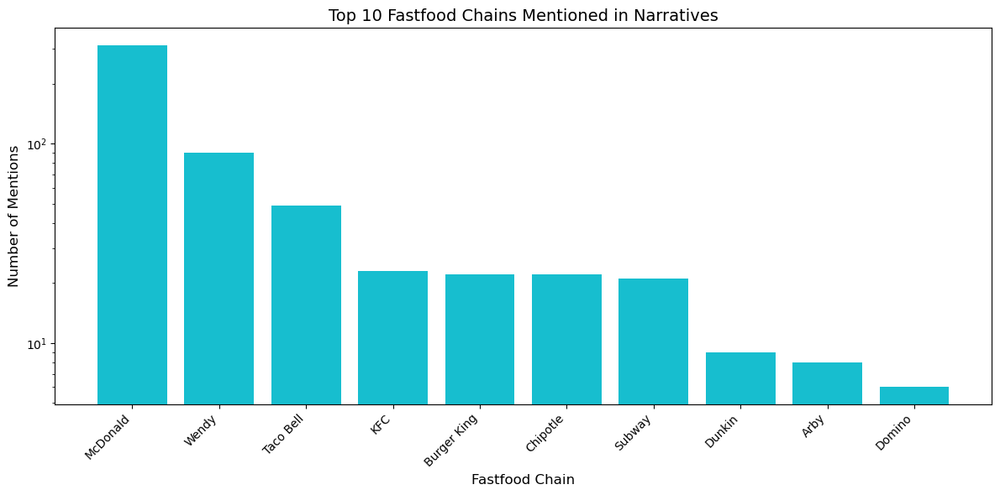

In [52]:
import matplotlib.pyplot as plt

# Plot

sorted_items = sorted(narrative_names.items(), key=lambda x: len(x[1]), reverse=True)

labels = [item[0] for item in sorted_items]
counts = [len(item[1]) for item in sorted_items]

plt.figure(figsize=(12, 6))
for chain in narrative_names:
    plt.bar(labels, counts)
plt.title("Top 10 Fastfood Chains Mentioned in Narratives",fontsize=14)
plt.ylabel("Number of Mentions",fontsize=12)
plt.xlabel("Fastfood Chain",fontsize=12)
plt.xticks(rotation=45, ha="right")
plt.yscale('log')
plt.tight_layout()

In [56]:
# Merge all fastfood documentnumbers in one file, because we don't care which chain it is
fastfood_document_numbers = [num for entry in narrative_names.values() for num in entry["DocumentNumber"]]

print(fastfood_document_numbers)
print("")
print(len(fastfood_document_numbers))

[20203168201, 20203169023, 20203171089, 20203175958, 20203183836, 20203187027, 20203203074, 20203205393, 20203206891, 20203209872, 20203213688, 20203219266, 20203220156, 20203223118, 20203223786, 20203230214, 20213003067, 20213007603, 20213008111, 20213019000, 20213032957, 20213036003, 20213036618, 20213042366, 20213064942, 20213076893, 20213079954, 20213083612, 20213086224, 20213092935, 20213098667, 20213100942, 20213110226, 20213110998, 20213113543, 20213124404, 20213126391, 20213126401, 20213131830, 20213133761, 20213133929, 20213137368, 20213137369, 20213138405, 20213147182, 20213147903, 20213158332, 20213167027, 20213167993, 20213172526, 20213172991, 20213178281, 20213181554, 20213184797, 20213196046, 20213202678, 20213211246, 20213218825, 20213236606, 20213247289, 20213252304, 20214153745, 20214172355, 20223009625, 20223017802, 20223018939, 20223024456, 20223030614, 20223035880, 20223041337, 20223044905, 20223048055, 20223054870, 20223057259, 20223059341, 20223072085, 20223073333

In [57]:
ff_narratives = narratives[narratives["DocumentNumber"].isin(fastfood_document_numbers)]

In [67]:
narrative_names.items()

dict_items([('McDonald',         DocumentNumber  Longitude   Latitude
497        20203168201 -83.160846  40.026772
570        20203169023 -83.112900  39.936340
714        20203171089 -82.970780  39.959050
986        20203175958 -83.044279  39.957380
1513       20203183836 -82.971170  39.953980
...                ...        ...        ...
113202     20253155992 -82.934959  39.868649
113591     20253160667 -82.917194  39.946947
113951     20253164925 -82.881550  39.897590
114296     20253168048 -82.917180  39.946970
115618     20258158560 -82.874887  39.955807

[313 rows x 3 columns]), ('Subway',         DocumentNumber  Longitude   Latitude
9162       20213047248 -82.912510  39.970630
10623      20213067446 -82.880670  39.955590
11334      20213080289 -82.828932  39.927369
11351      20213080429 -83.092550  39.958460
12494      20213097638 -82.981281  39.994094
21815      20213243354 -82.829660  39.941190
31826      20223039846 -82.952044  40.108475
36111      20223104060 -82.908490  40.

In [68]:
# add the restaurant name to the ff_narratives df
number_to_chain = {}

for name, df in narrative_names.items():
    for num in df["DocumentNumber"]:
        number_to_chain[num] = name

print(number_to_chain)


{20203168201: 'McDonald', 20203169023: 'McDonald', 20203171089: 'McDonald', 20203175958: 'McDonald', 20203183836: 'McDonald', 20203187027: 'McDonald', 20203203074: 'McDonald', 20203205393: 'McDonald', 20203206891: 'McDonald', 20203209872: 'McDonald', 20203213688: 'McDonald', 20203219266: 'McDonald', 20203220156: 'McDonald', 20203223118: 'McDonald', 20203223786: 'McDonald', 20203230214: 'McDonald', 20213003067: 'McDonald', 20213007603: 'McDonald', 20213008111: 'McDonald', 20213019000: 'McDonald', 20213032957: 'McDonald', 20213036003: 'McDonald', 20213036618: 'McDonald', 20213042366: 'McDonald', 20213064942: 'McDonald', 20213076893: 'McDonald', 20213079954: 'McDonald', 20213083612: 'McDonald', 20213086224: 'McDonald', 20213092935: 'McDonald', 20213098667: 'McDonald', 20213100942: 'McDonald', 20213110226: 'McDonald', 20213110998: 'McDonald', 20213113543: 'McDonald', 20213124404: 'McDonald', 20213126391: 'McDonald', 20213126401: 'McDonald', 20213131830: 'McDonald', 20213133761: 'McDonald',

In [69]:
# add the restaurant name to the ff_narratives df for nicer plotting
ff_narratives["RestaurantName"] = ff_narratives["DocumentNumber"].map(number_to_chain)


C:\Users\boie.2\AppData\Local\Temp\ipykernel_35060\2935837715.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [73]:
# save the ff_narratives df as geopackage file
fastfood_crashes_gdf = gpd.GeoDataFrame(ff_narratives, geometry=gpd.points_from_xy(ff_narratives.Longitude, ff_narratives.Latitude))


In [70]:
ff_narratives

,DocumentNumber,County,Latitude,Longitude,Narrative,RestaurantName
497,20203168201,Franklin County,40.026772,-83.160846,Unit 1 was traveling south on Main Street pass...,McDonald
570,20203169023,Franklin County,39.936340,-83.112900,On 10-6-2020 Unit #1 was traveling from North ...,McDonald
714,20203171089,Franklin County,39.959050,-82.970780,On 10/9/2020 at approximately 8:55 PM; Officer...,McDonald
986,20203175958,Franklin County,39.957380,-83.044279,Diver of Unit 2 states she was in the drive th...,McDonald
1513,20203183836,Franklin County,39.953980,-82.971170,On 10/23/2020 at approxiamtely 4:53 PM; Office...,McDonald
...,...,...,...,...,...,...
113951,20253164925,Franklin County,39.897590,-82.881550,Driver of Unit #1 was driving through the park...,McDonald
114296,20253168048,Franklin County,39.946970,-82.917180,On 9/11/2025 the driver of Unit 2 stated he wa...,McDonald
115281,20258051287,Franklin County,39.955492,-82.878563,On March 19; 2025; at around 1613 hours; unit ...,Burger King
115292,20258054115,Franklin County,39.977023,-82.867472,Unit #1 was westbound on E. Broad Street when ...,Domino


In [30]:
print(narrative_names["McDonald"])

497       20203168201
570       20203169023
714       20203171089
986       20203175958
1513      20203183836
             ...     
113202    20253155992
113591    20253160667
113951    20253164925
114296    20253168048
115618    20258158560
Name: DocumentNumber, Length: 313, dtype: int64


In [14]:
narratives


,DocumentNumber,County,Latitude,Longitude,Narrative
0,20202168971,Franklin County,39.953682,-83.099864,Unit# 1 a pedestrian was crossing US-40 from s...
1,20202168999,Franklin County,39.832050,-82.984140,Unit 1 was westbound on SR 317 towards Parsons...
2,20202172825,Franklin County,39.806068,-83.030432,Unit 2 was traveling south on SR 104 south of ...
3,20202183697,Franklin County,39.953254,-83.098701,Unit 1 was crossing US 40 outside of the cross...
4,20202206898,Franklin County,40.048172,-82.944954,Unit 1 was driving south on SR 3 just north of...
...,...,...,...,...,...
115676,20258172808,Franklin County,40.031000,-83.051000,On Sunday; September 21; 2025; Unit 2 was stop...
115677,20258173076,Franklin County,39.955371,-82.873076,On above date and time U-1 failed to yield at ...
115678,20258173087,Franklin County,39.954530,-82.878540,Unit #1 was traveling eastbound on Josephus Ln...
115679,20258173091,Franklin County,39.959634,-82.878754,During the night of September 13th; 2025 after...


In [13]:
import geopandas as gpd
import plotly.graph_objects as go
import pandas as pd
import numpy as np
import plotly.io as pio
pio.renderers.default = 'notebook'

# Load fast food GeoPackage
fastfood = gpd.read_file("Data/fastfood_location_name_amenity.gpkg")

# Ensure correct CRS (Plotly requires WGS84)
if fastfood.crs is not None and fastfood.crs.to_epsg() != 4326:
    fastfood = fastfood.to_crs(epsg=4326)

# Extract latitude and longitude from geometry
fastfood["lat"] = fastfood.geometry.centroid.y
fastfood["lon"] = fastfood.geometry.centroid.x

# Load crash data
df = pd.read_csv("Data/CrashStatisticsFranklinCounty.csv")

# Drop rows with missing coordinates
df = df.dropna(subset=["Latitude", "Longitude"])

# Create figure
fig = go.Figure()

# Add crash points (transparent)
fig.add_trace(
    go.Scattermapbox(
        lat=df["Latitude"],
        lon=df["Longitude"],
        mode="markers",
        marker=go.scattermapbox.Marker(
            size=6,
            color="blue",
            opacity=0.2  # transparency here
        ),
        name="Individual Crashes",
        text=None
    )
)

# Add fast food locations
fig.add_trace(
    go.Scattermapbox(
        lat=fastfood["lat"],
        lon=fastfood["lon"],
        mode="markers",
        marker=go.scattermapbox.Marker(
            size=6,
            color="red"
        ),
        text=fastfood["name_normalized"],
        name="Fast Food"
    )
)

# Update layout
fig.update_layout(
    mapbox=dict(
        style="carto-positron",
        center=dict(lat=39.96, lon=-83.0),
        zoom=9
    ),
    title="Individual Crash Locations and Fast Food Restaurants in Ohio",
    margin=dict(l=0, r=0, t=50, b=0),
    legend=dict(yanchor="top", y=0.98, xanchor="left", x=0.02)
)

fig.show()


C:\Users\raab.75\AppData\Local\Temp\ipykernel_43368\3418194718.py:16: UserWarning:

Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.


C:\Users\raab.75\AppData\Local\Temp\ipykernel_43368\3418194718.py:17: UserWarning:

Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.


C:\Users\raab.75\AppData\Local\Temp\ipykernel_43368\3418194718.py:20: DtypeWarning:

Columns (23,31) have mixed types. Specify dtype option on import or set low_memory=False.

